In [1]:
%runfile H3.py

In [2]:
from utils import (make_M_alphas, 
                   make_poly_from_edges, 
                   poly_equiv, tri0, tri1, tri2, cycle_poly, std_poly,
                   poly_gl2_orbit_reps, 
                   aas_triangle_gl2_orbit_reps, 
                   square_parameters, 
                   aaa_triangle_parameters, 
                   aas_triangle_parameters)

In [3]:
kdata = make_k(-20)
k = kdata['k']
w = kdata['w']
zero = k(0)
one = k(1)
Ireps = kdata['Ireps']
inf = cusp(infinity, k)

In [4]:
alphas = precomputed_alphas(k)
M_alphas, alpha_inv = make_M_alphas(alphas)

assert alphas == [cusp(zero), cusp(w/2), cusp((w-4)/(2*w)), cusp((4-w)/(2*w))]

sigmas = singular_points_new(k)
assert sigmas == [inf, cusp((1+w)/2)]


In [5]:
polys, hemis = all_polyhedra(k)
print("{} polyhedra constructed".format(len(polys)))

New orbit from P_0=[-2/5*w - 2/5, 1/25]: {0, 1, 2, 3}
New orbit from P_4=[3/8*w + 1/2, 3/64]: {4, 5}
Found [[4, 5], [0, 1, 2, 3]] orbits:
Constructed 2 polyhedra
Faces: [[4, 4, 3, 4, 3], [4, 4, 4, 4, 4, 4]]
New orbit from R_0=[5/12*w + 5/12, 1/24]: {0, 1, 2, 3}
Found 1 orbits with representative points [[0, 1, 2, 3]]:
Constructed 1 polyhedra
Faces: [[4, 3, 3, 3, 3]]
3 polyhedra constructed


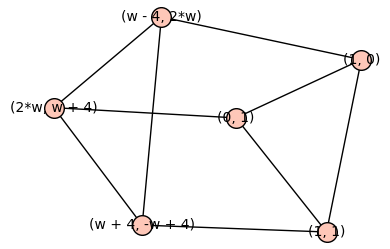

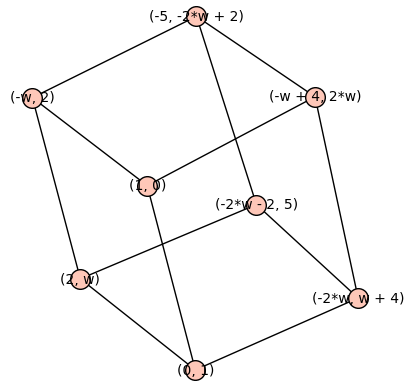

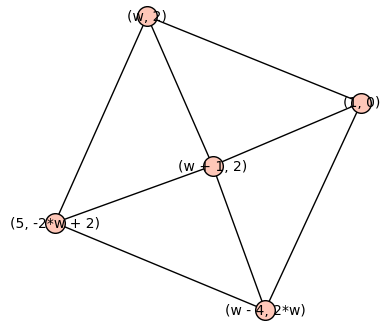

In [6]:
for G in polys: show(G)

In [7]:
triangles = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==3] for G in polys],[])]
squares = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==4] for G in polys],[])]
hexagons = [make_poly_from_edges(t,k) for t in sum([[F for F in G.faces() if len(F)==6] for G in polys],[])]
aaa_triangles = [T for T in triangles if is_poly_principal(T)]
aas_triangles = [T for T in triangles if not is_poly_principal(T)]

In [8]:
[len(t) for t in [aaa_triangles, aas_triangles, squares, hexagons]]

[2, 4, 10, 0]

In [9]:
aaa_triangles0 = poly_gl2_orbit_reps(aaa_triangles, alphas)
aas_triangles0 = aas_triangle_gl2_orbit_reps(aas_triangles, alphas)
squares0 = poly_gl2_orbit_reps(squares, alphas)
hexagons0 = poly_gl2_orbit_reps(hexagons, alphas)

In [10]:
[len(t) for t in [aaa_triangles0, aas_triangles0, squares0, hexagons0]]

[1, 2, 3, 0]

In [11]:
[square_parameters(S, alphas, M_alphas, alpha_inv) for S in squares0]

[[[0, 2, 0, 3], [1, 1, 0]],
 [[0, 1, 0, 1], [0, 0, 0]],
 [[1, 3, 1, 2], [-w, 0, -1]]]

In [12]:
[aas_triangle_parameters(T, alphas, M_alphas, sigmas) for T in aas_triangles0]

[[[2, 1, 1], 0], [[1, 1, 1], 0]]

In [13]:
triangles1 = [T for T in aaa_triangles0 if not any(poly_equiv(T, t) for t in [tri0(k), tri1(k), tri2(k)])]
triangles1

[]

In [14]:
[aaa_triangle_parameters(T) for T in triangles1]

[]

In [15]:
plot_Bianchi_diagram(k,hemis)

Graphics3d Object

In [16]:
from polyhedra import all_poly_types, poly_types

In [17]:
poly_types(polys)

{'tetrahedron': 0,
 'cube': 1,
 'square prism': 1,
 'triangular prism': 1,
 'hexagonal cap': 0,
 'truncated tetrahedron': 0,
 'cuboctahedron': 0}

In [18]:
all_poly_types(polys)

['triangular prism', 'cube', 'square prism']